### 1

In [24]:
"""
03_scene_clip.ipynb – klasyfikacja typu sceny przy użyciu CLIP (zero-shot).
"""

from pathlib import Path
from datetime import datetime, timezone
from contextlib import nullcontext
import time
import json

import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

# importy CLIP z naszego modułu src/
from src.clip_utils import (
    get_device,
    load_clip_model,
    run_clip_scene_batch,
)

### 2

In [25]:
"""
Ustawienia urządzenia i precyzji FP16 dla CLIP.
"""

device = get_device()
IMG_DTYPE = (
    "fp16" if device.type in ("cuda", "mps") else "fp32"
)
TEXT_DTYPE = IMG_DTYPE

print("Device:", device, "| IMG_DTYPE:", IMG_DTYPE)

Device: mps | IMG_DTYPE: fp16


### 3

In [26]:
"""
Ścieżki wejścia/wyjścia dla klasyfikacji scen oraz ładowanie modelu CLIP.
"""

PROJECT_ROOT = Path(".").resolve()
DIR_DATA = PROJECT_ROOT / "data"
DIR_STAGING = DIR_DATA / "test_scenes"
DIR_OUT = PROJECT_ROOT / "outputs"
DIR_OUT.mkdir(parents=True, exist_ok=True)

CSV_PATH = DIR_OUT / "scene_clip_results.csv"

LOGS_DIR = PROJECT_ROOT / "logs"
LOGS_DIR.mkdir(parents=True, exist_ok=True)
RUNLOG_PATH = LOGS_DIR / "runlog.jsonl"

print("Wejście (obrazy):", DIR_STAGING)
print("Wyjście (CSV):   ", CSV_PATH)

# ładowanie modelu CLIP
model, preprocess, tokenizer = load_clip_model(
    model_name="ViT-B-32",
    pretrained="openai",
    device=device,
)

Wejście (obrazy): /Users/olga/MetaLogic/data/test_scenes
Wyjście (CSV):    /Users/olga/MetaLogic/outputs/scene_clip_results.csv


/Users/olga/MetaLogic/.venv/lib/python3.13/site-packages/open_clip/factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(


### 4

In [27]:
"""
Definicja etykiet scen i promptów tekstowych.

SCENE_LABELS – etykiety, które trafią potem do kolumny 'scene_label'
PROMPTS      – teksty, które chcesz podać CLIP-owi (mogą być takie same
               jak SCENE_LABELS albo np. PL vs EN).
"""

# Lista promptów (etykieta_PL, prompt_EN)
LABEL_TO_PROMPT = [
    ("plac miejski", "city square"),
    ("targowisko lub rynek", "street market"),
    ("fabryka lub zakład przemysłowy", "factory exterior"),
    ("demonstracja uliczna", "street protest"),
    ("blokowisko lub osiedle mieszkaniowe", "apartment block area"),
    ("komunikacja miejska", "public transport in the city"),
    ("scena wiejska", "rural countryside scene"),
    ("pola i gospodarstwa", "farmland landscape"),
    ("droga wiejska", "country road"),
    ("wieś z zabudową tradycyjną", "village street"),
    ("wnętrze mieszkania", "interior of a flat"),
    ("wnętrze biura lub instytucji", "office or institutional interior"),
    ("wnętrze sklepu", "shop interior"),
    ("wnętrze zakładu pracy", "factory interior"),
    ("portret jednej osoby", "portrait of one person"),
    ("grupa ludzi w pomieszczeniu", "group of people indoors"),
    ("tłum na wydarzeniu wewnątrz", "crowd of people at an indoor event"),
    ("grupa ludzi na zewnątrz", "group of people outdoors"),
    ("tłum na ulicy", "crowd of people on the street"),
    ("uroczystość lub wydarzenie publiczne", "public ceremony or event"),
    ("park lub zieleń miejska", "city park"),
    ("krajobraz naturalny bez zabudowań", "natural landscape without buildings"),
    ("jezioro lub rzeka", "lake or river scene"),
    ("plac budowy", "construction site"),
    ("lotnisko lub dworzec", "airport or train station"),
    ("plac zabaw lub boisko sportowe", "playground or sports field"),
    ("restauracja lub kawiarnia", "restaurant or cafe interior"),
    ("auto", "car exterior"),
    ("autobus lub tramwaj", "bus or tram exterior"),
    ("pociąg", "train exterior"),
    ("samolot", "airplane exterior"),
    ("balon", "hot air balloon exterior"),
    ("rowery lub motocykle", "bicycles or motorcycles"),
    ("ulica w starej części miasta", "old town street"),
    ("kamienice lub zabytkowe budynki", "historic buildings or tenements"),
    ("nowoczesne budynki lub wieżowce", "modern buildings or skyscrapers"),
    ("bloki z welkiej płyty", "prefabricated apartment blocks"),
    ("ulica w słoneczny dzień", "street on a sunny day"),
    ("ulica o zmierzchu", "street at dusk"),
    ("ulica w deszczu", "street in the rain"),
    ("ulica nocą", "street at night"),
    ("słoneczna pogoda", "sunny weather scene"),
    ("pochmurna pogoda", "cloudy weather scene"),
    ("śnieżna pogoda", "snowy weather scene"),
    ("wózki dziecięce lub place zabaw", "strollers or playgrounds"),
    ("zwierzęta domowe lub zwierzęta na ulicy", "pets or street animals"),
    ("instrumenty muzyczne lub występy uliczne", "musical instruments or street performances"),
    ("studio nagrań lub plan filmowy", "recording studio or film set"),
    ("studio muzyczne", "music studio interior"),
    ("pomniki lub rzeźby miejskie", "monuments or urban sculptures"),
    ("mosty lub wiadukty", "bridges or viaducts"),
    ("fontanny lub miejskie zbiorniki wodne", "fountains or urban water features"),
    ("plakat uliczny", "street poster on a wall or door"),
    ("napisy lub hasła na murach", "graffiti or political slogans on walls"),
    ("szyldy sklepowe lub reklamy uliczne", "shop signs or street advertisements"),
    ("papierosy lub palenie na ulicy", "cigarettes or street smoking"),
]

# etykiety PL i prompty EN wyciągamy z listy:
SCENE_LABELS_PL = [pl for (pl, en) in LABEL_TO_PROMPT]
PROMPTS = [en for (pl, en) in LABEL_TO_PROMPT]

# słownik: prompt_EN -> etykieta_PL
PROMPT_TO_LABEL_PL = dict(zip(PROMPTS, SCENE_LABELS_PL))

print("Liczba etykiet scen:", len(SCENE_LABELS_PL))


Liczba etykiet scen: 56


### 5

In [28]:
"""
Wczytuje wszystkie obrazy z katalogu, przepuszcza każdy przez CLIP Zero-Shot, wyznacza najlepszą scenę dla każdego zdjęcia, mierzy czas, pokazuje progress bar i zwraca DataFrame z wynikami.

Główna pętla: klasyfikacja wszystkich obrazów w katalogu wejściowym
przy użyciu funkcji run_clip_scene_batch z modułu src.clip_utils.
"""

from tqdm.auto import tqdm

# dozwolone rozszerzenia obrazów
IMAGE_EXTS = {".jpg", ".jpeg", ".png", ".tif", ".tiff", ".bmp"}

image_paths = [
    p for p in sorted(DIR_STAGING.glob("*"))
    if p.is_file() and p.suffix.lower() in IMAGE_EXTS
]

print("Liczba znalezionych obrazów:", len(image_paths))

t0 = time.time()

df_scenes = run_clip_scene_batch(
    model=model,
    preprocess=preprocess,
    tokenizer=tokenizer,
    image_paths=tqdm(image_paths, desc="CLIP scene classification"),
    scene_labels=PROMPTS,   # prompty EN
    device=device,
)

dt = time.time() - t0
if len(df_scenes) > 0:
    print(f"Przetworzono {len(df_scenes)} obrazów w {dt:.1f} s ({len(df_scenes) / dt:.2f} img/s).")

df_scenes.head()

Liczba znalezionych obrazów: 271


CLIP scene classification:   0%|          | 0/271 [00:00<?, ?it/s]

/Users/olga/MetaLogic/src/clip_utils.py:107: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast(enabled=dev.type != "cpu"):
/Users/olga/MetaLogic/.venv/lib/python3.13/site-packages/torch/amp/autocast_mode.py:270: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(
/Users/olga/MetaLogic/src/clip_utils.py:76: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast(enabled=dev.type != "cpu"):


Przetworzono 271 obrazów w 90.3 s (3.00 img/s).


,file_path,scene_label,scene_score
0,/Users/olga/MetaLogic/data/test_scenes/JMi_001...,hot air balloon exterior,0.019803
1,/Users/olga/MetaLogic/data/test_scenes/JMi_012...,city park,0.018512
2,/Users/olga/MetaLogic/data/test_scenes/JMi_012...,apartment block area,0.018753
3,/Users/olga/MetaLogic/data/test_scenes/JMi_012...,bridges or viaducts,0.018776
4,/Users/olga/MetaLogic/data/test_scenes/JMi_013...,apartment block area,0.018801


### 6

In [29]:
"""
Zamiana promptów EN na etykiety PL oraz zapis wyników do CSV i runlog.jsonl.
"""

# zakładamy df_scenes prosto z run_clip_scene_batch:
#   file_path, scene_label (EN), scene_score

df_scenes = df_scenes.copy()

# 1) zachowujemy prompt EN w osobnej kolumnie
df_scenes["scene_prompt_en"] = df_scenes["scene_label"]

# 2) dodajemy kolumnę z etykietą PL zgodnie z nazewnictwem
df_scenes["scene_label"] = df_scenes["scene_prompt_en"].map(PROMPT_TO_LABEL_PL)

# 3) dodajemy timestamp i zapisujemy CSV
timestamp = datetime.now(timezone.utc).isoformat()
df_scenes["timestamp"] = timestamp

df_scenes.to_csv(CSV_PATH, index=False)
print("Zapisano wyniki do:", CSV_PATH)

# 4) wpis do runlog.jsonl
runlog_entry = {
    "timestamp": timestamp,
    "step": "scene_clip",
    "n_images": int(len(df_scenes)),
    "csv_path": str(CSV_PATH),
    "model_name": "ViT-B-32",
    "pretrained": "openai",
    "device": str(device),
    "dtype": str(IMG_DTYPE),
}

with RUNLOG_PATH.open("a", encoding="utf-8") as f:
    f.write(json.dumps(runlog_entry, ensure_ascii=False) + "\n")

print("Dopisano wpis do:", RUNLOG_PATH)

Zapisano wyniki do: /Users/olga/MetaLogic/outputs/scene_clip_results.csv
Dopisano wpis do: /Users/olga/MetaLogic/logs/runlog.jsonl


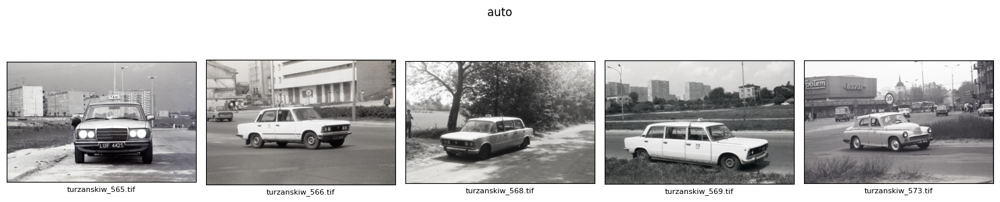

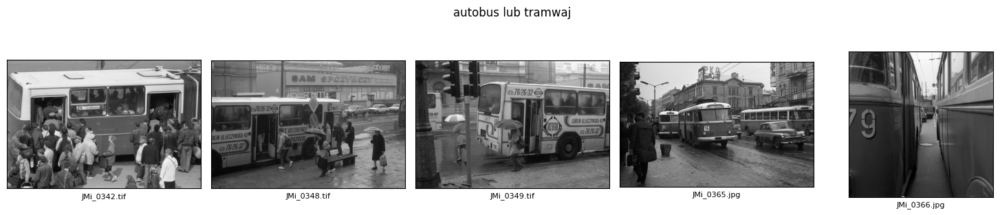

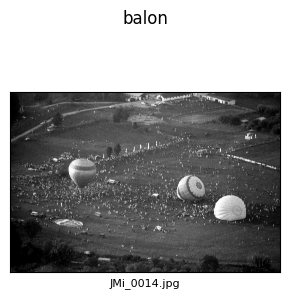

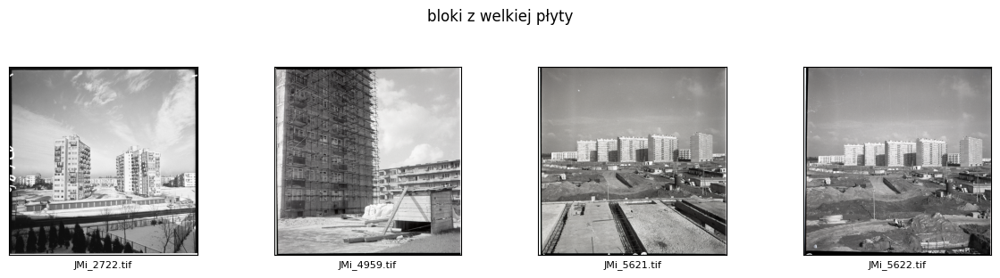

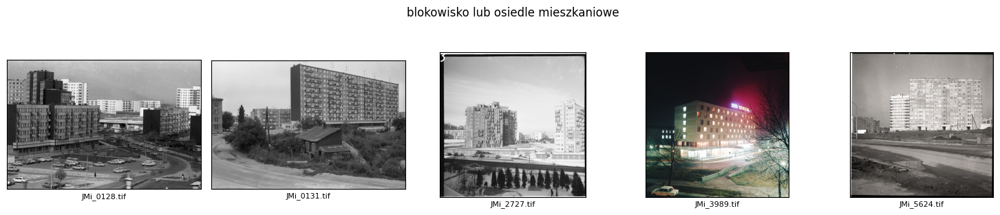

...

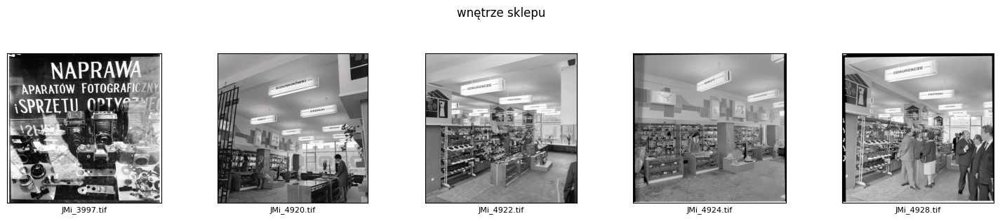

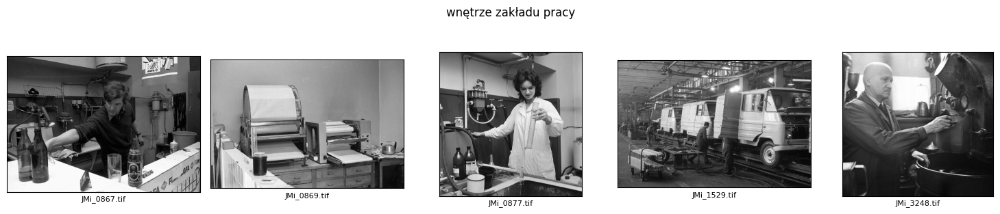

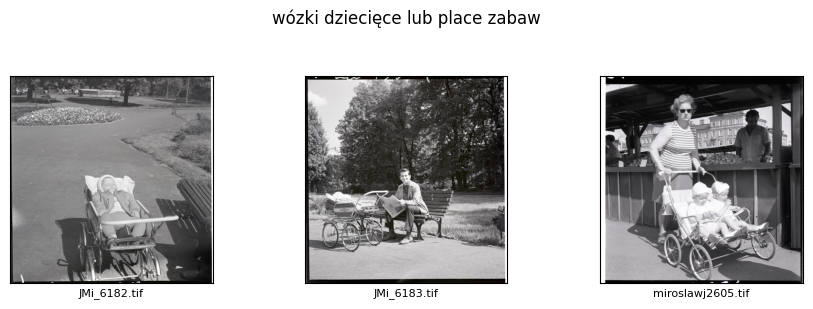

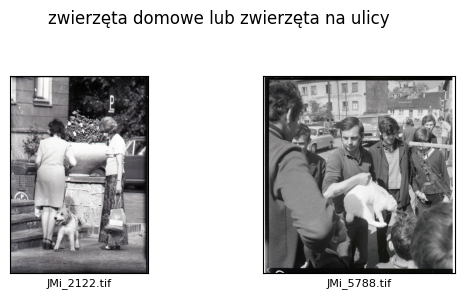

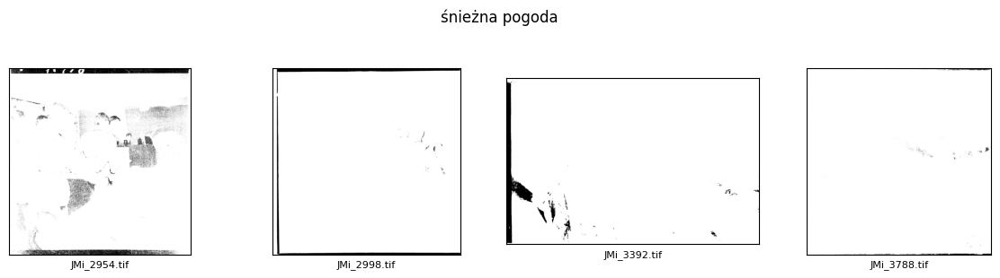

In [31]:
"""
Podgląd miniatur pogrupowanych wg przypisanej etykiety sceny.

Dla KAŻDEJ etykiety sceny:
- rysujemy osobną figurę,
- na górze tekst etykiety (np. "plac miejski"),
- pod spodem do n_per_label miniatur,
- pod miniaturami tylko nazwa pliku.
"""

from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt


def show_thumbnails_all_labels(
    df_scenes: pd.DataFrame,
    project_root: Path,
    n_per_label: int = 5,
) -> None:
    """
    Rysuje osobne rzędy miniatur dla każdej etykiety sceny.

    df_scenes   – DataFrame z kolumnami:
                  'file_path' (str), 'scene_label' (PL)
    project_root – katalog bazowy repozytorium (Path(".").resolve())
    n_per_label – maksymalna liczba miniatur na etykietę
    """
    if df_scenes.empty:
        print("df_scenes jest pusty – brak danych do podglądu.")
        return

    # lista wszystkich etykiet (unikalne, posortowane)
    labels = sorted(df_scenes["scene_label"].dropna().unique())

    for label in labels:
        subset = (
            df_scenes[df_scenes["scene_label"] == label]
            .drop_duplicates(subset=["file_path"])
            .head(n_per_label)
        )

        if subset.empty:
            continue

        n_cols = len(subset)
        fig, axes = plt.subplots(1, n_cols, figsize=(3 * n_cols, 3))
        if n_cols == 1:
            axes = [axes]

        fig.suptitle(label, fontsize=12)

        for ax, (_, rec) in zip(axes, subset.iterrows()):
            ax.set_xticks([])
            ax.set_yticks([])

            img_path = project_root / rec["file_path"]
            try:
                img = Image.open(img_path).convert("RGB")
            except Exception:
                ax.axis("off")
                continue

            ax.imshow(img)
            filename = Path(rec["file_path"]).name
            ax.set_xlabel(filename, fontsize=8)

        plt.tight_layout(rect=[0, 0, 1, 0.92])  # zostawiamy miejsce na tytuł
        plt.show()


show_thumbnails_all_labels(df_scenes, PROJECT_ROOT, n_per_label=5)